In [1]:
# %install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, MultiPoint
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx
import rasterio

time: 1.95 s (started: 2021-08-15 11:11:45 +02:00)


In [2]:
# in case of encountering problems with GEOS or GDAL, disable speedups from shapely
from shapely import speedups
speedups.disable()

time: 455 µs (started: 2021-08-15 11:11:47 +02:00)


Yerevan coordinate reference system:  epsg:4326
Projected Yerevan coordinate reference system:  +proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


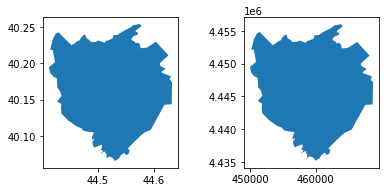

time: 508 ms (started: 2021-08-15 11:11:47 +02:00)


In [3]:
# load Milan city from openstreetmap using osmmnx api

city_name = 'Yerevan, Armenia'
city = ox.geocode_to_gdf(city_name)
print('Yerevan coordinate reference system: ', city.crs)

# project to the local coordinate reference system
city_proj = ox.projection.project_gdf(city)
print('Projected Yerevan coordinate reference system: ', city_proj.crs)

fig, (ax1, ax2) = plt.subplots(1, 2)
city.plot(ax=ax1, ec='none')
city_proj.plot(ax=ax2, ec='none' )
plt.tight_layout(pad=3.0)
plt.show()

In [4]:
# convert to "ESRI:54009" coordinate system, since that's the system NASA uses
city = city.to_crs("ESRI:54009") 
print(city.crs)

ESRI:54009
time: 237 ms (started: 2021-08-15 11:11:47 +02:00)


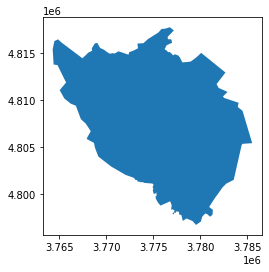

time: 118 ms (started: 2021-08-15 11:11:47 +02:00)


In [5]:
# plot city in new projection
ax = city.plot(ec='none')


In [6]:
# save to file
city.to_file('yerevan_54009.shp')

time: 62.8 ms (started: 2021-08-15 11:11:47 +02:00)


<ipython-input-6-fda8c0606443>:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  city.to_file('yerevan_54009.shp')


In [7]:
# load the saved file
import fiona
with fiona.open("yerevan_54009.shp", "r") as shapefile:
    shapes = [feature["geometry"] for feature in shapefile]

time: 200 ms (started: 2021-08-15 11:11:48 +02:00)


In [8]:
# load the NASA population density raster file
# Data source: https://sedac.ciesin.columbia.edu/data/collection/gpw-v4
import rasterio.mask
with rasterio.open("data/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0/GHS_POP_E2015_GLOBE_R2019A_54009_250_V1_0.tif") as src:
    # since the NASA data is for the entire world, we will use the 'shapes' polygon containing our city to mask out
    # the population raster data corresponding to our city
    out_image, out_transform = rasterio.mask.mask(src, shapes, crop=True, nodata=0)
    out_meta = src.meta

time: 137 ms (started: 2021-08-15 11:11:48 +02:00)


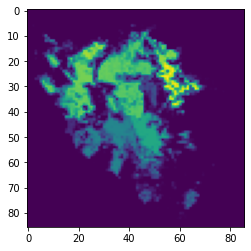

time: 135 ms (started: 2021-08-15 11:11:48 +02:00)


In [9]:
plt.imshow(out_image[0])

In [10]:
# since the raster array contains many dimensions, we assign the dimension containing the population density data to a new 
# variable
pop_density = out_image[0,:,:]
pop_density

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

time: 3.08 ms (started: 2021-08-15 11:11:48 +02:00)


In [11]:
# just in case, set all negative values to zero
pop_density[pop_density < 0] = 0

time: 407 µs (started: 2021-08-15 11:11:48 +02:00)


In [12]:
# split city into 400 x 400 meter grid cells
geometry = city_proj['geometry'].iloc[0]
print(type(geometry))
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width = 400)
print(type(geometry_cut))

<class 'shapely.geometry.polygon.Polygon'>
<class 'shapely.geometry.multipolygon.MultiPolygon'>
time: 9.95 s (started: 2021-08-15 11:11:48 +02:00)


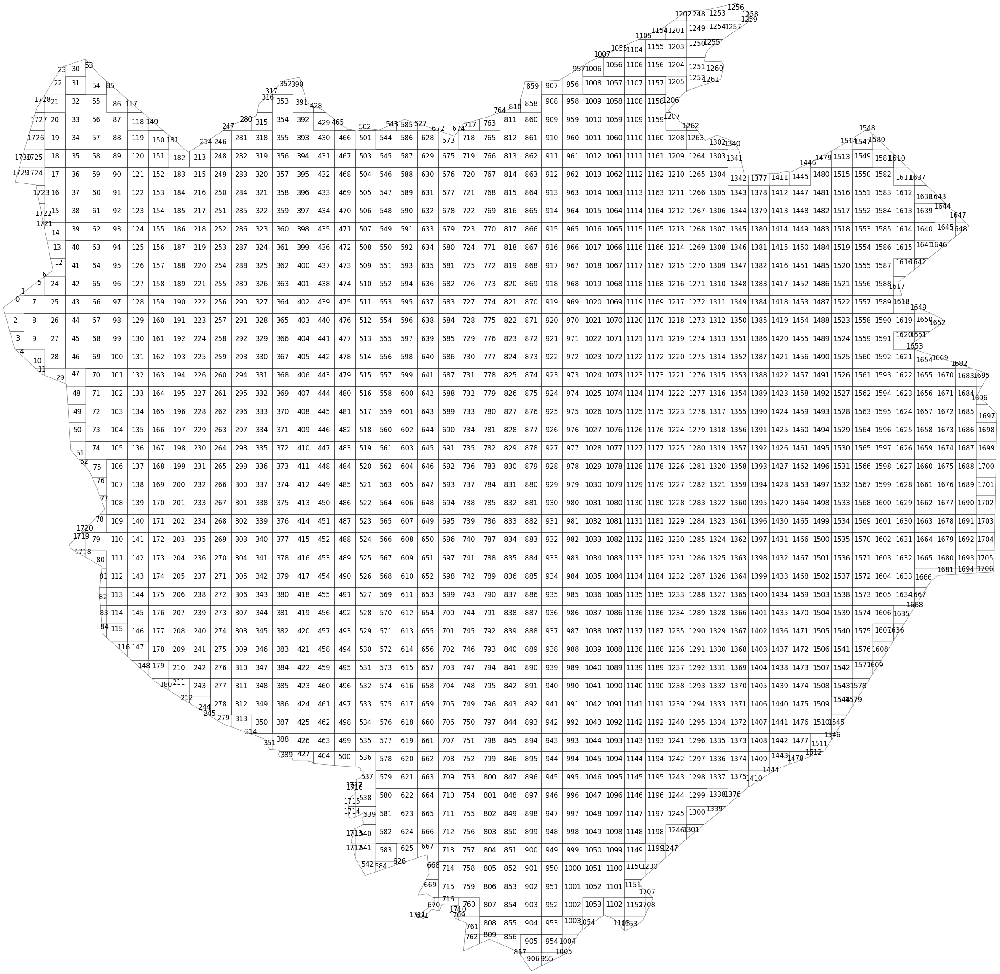

time: 8.86 s (started: 2021-08-15 11:11:58 +02:00)


In [13]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city_proj.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
# create geodataframe from the square grid polygons
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city_proj.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


,geometry
0,"POLYGON ((449912.757 4449454.549, 450231.958 4..."
1,"POLYGON ((450231.958 4449727.891, 450305.028 4..."
2,"POLYGON ((450305.028 4449333.987, 450305.028 4..."
3,"POLYGON ((450305.028 4448940.084, 450305.028 4..."
4,"POLYGON ((450305.028 4448546.181, 450305.028 4..."


time: 25.6 ms (started: 2021-08-15 11:12:07 +02:00)


<AxesSubplot:>

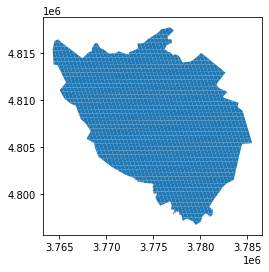

time: 798 ms (started: 2021-08-15 11:12:07 +02:00)


In [15]:
# convert to the NASA crs we introduced earlier
polyframe= polyframe.to_crs(city.crs)
polyframe.plot()

In [16]:
# load library for aggregating raster data into vector polygons
from rasterstats import zonal_stats

time: 83 ms (started: 2021-08-15 11:12:08 +02:00)


In [17]:
# compute the mean value of all raster values that fall into a given quadratic cell

affine = out_transform
city_stats = zonal_stats(polyframe, pop_density, affine=affine, stats='mean', nodata=0)
pop_array = np.array([list(item.values())[0] if list(item.values())[0] is not None else 0 for item in city_stats])
pop_array[:20]

array([104.18190765,   0.        ,   0.        ,   0.        ,
         0.        , 118.75224686,   0.        , 304.38119507,
       567.96207809, 413.56039429, 208.11979739,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
        59.05667353,  67.20082855,   0.        ,   0.        ])

time: 1.58 s (started: 2021-08-15 11:12:08 +02:00)


In [18]:
city_stats[:10]

[{'mean': 104.1819076538086},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': None},
 {'mean': 118.75224685668945},
 {'mean': None},
 {'mean': 304.3811950683594},
 {'mean': 567.9620780944824},
 {'mean': 413.5603942871094}]

time: 2.85 ms (started: 2021-08-15 11:12:09 +02:00)


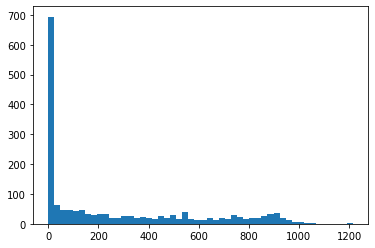

time: 155 ms (started: 2021-08-15 11:12:09 +02:00)


In [19]:
# plot histogram of the obtained population density values
plt.hist(pop_array, bins=50)
plt.show()

In [20]:
# assign the population values as a new column in the geodataframe with the grid cells, 
# so we know which grid cell has what population.

polyframe["population"] = pop_array
polyframe.head()

,geometry,population
0,"POLYGON ((3765046.926 4811070.938, 3765276.812...",104.181908
1,"POLYGON ((3765276.812 4811348.017, 3765329.437...",0.000000
2,"POLYGON ((3765475.321 4810952.269, 3765601.195...",0.000000
3,"POLYGON ((3765601.195 4810556.029, 3765727.056...",0.000000
4,"POLYGON ((3765727.056 4810159.780, 3765779.306...",0.000000


time: 22.2 ms (started: 2021-08-15 11:12:10 +02:00)


(256, 4)
[[1.         0.96078431 0.94117647 1.        ]
 [0.99987697 0.95820069 0.93748558 1.        ]
 [0.99975394 0.95561707 0.93379469 1.        ]
 ...
 [0.41917724 0.00369089 0.05294887 1.        ]
 [0.4115494  0.00184544 0.05196463 1.        ]
 [0.40392157 0.         0.05098039 1.        ]]


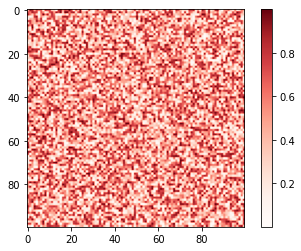

time: 147 ms (started: 2021-08-15 11:12:10 +02:00)


In [21]:
# in order to achieve a nice-looking visualisation, let's create a custom colormap, that fades away into transparency

ncolors = 256
# get cmap
color_array = plt.get_cmap('Reds')(range(ncolors))
print(color_array.shape)
print(color_array)

# change alpha values
color_array[:, -1] = np.linspace(0.3, 1, ncolors)

# create colormap object
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

map_object = LinearSegmentedColormap.from_list(name="Reds_transp", colors=color_array)

# register the colormap object
plt.register_cmap(cmap=map_object)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap='Reds_transp')
plt.colorbar(mappable=h)

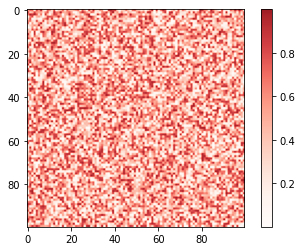

time: 147 ms (started: 2021-08-15 11:12:10 +02:00)


In [22]:
# let's cut it at the top for a better visual impact

def trunc_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = LinearSegmentedColormap.from_list('trunc({n}, {a:.2f}, {b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
                                                cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Reds_transp')
new_cmap = trunc_colormap(cmap, 0.0, .9)

# plot some example data
fig, ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100), cmap=new_cmap)
plt.colorbar(mappable=h)

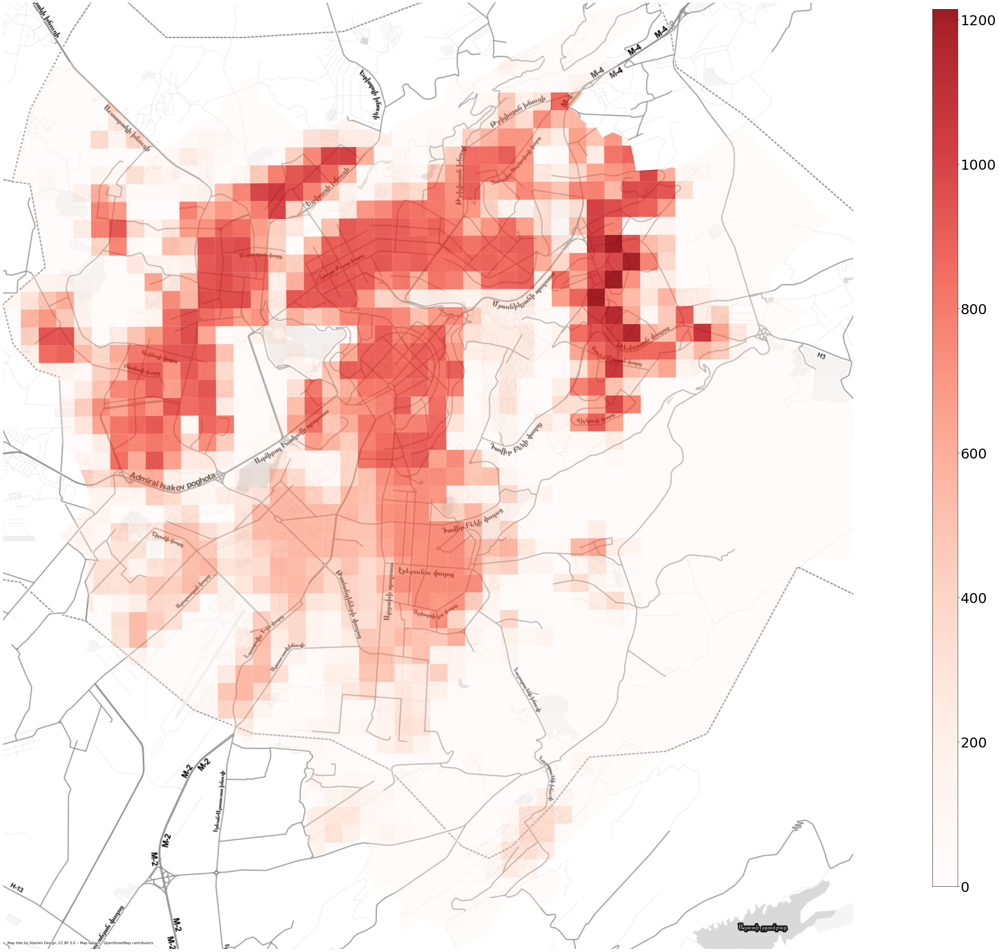

time: 10.4 s (started: 2021-08-15 11:12:10 +02:00)


In [23]:
# plot the population density data on a map background
plt.rcParams.update({'font.size':32})
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

#ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
fig, ax = plt.subplots(figsize=(40,40))
polyframe_3857.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_3857.population), vmax=max(polyframe_3857.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

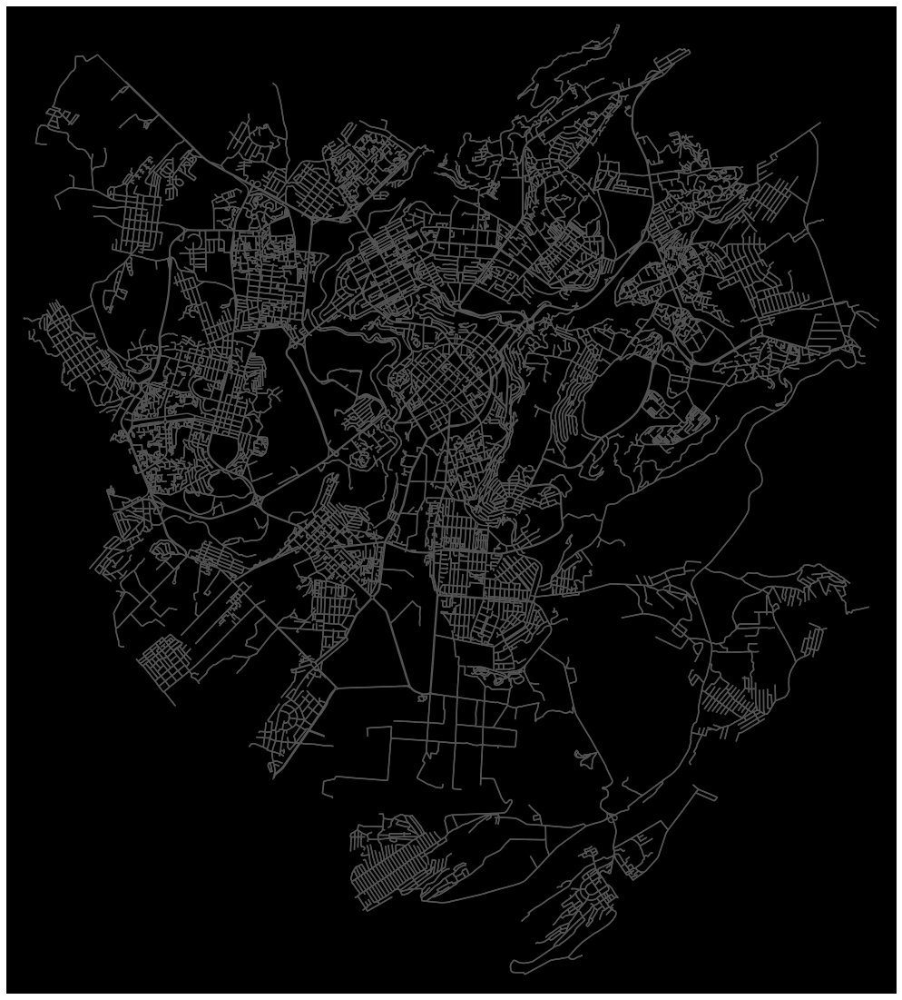

time: 17.2 s (started: 2021-08-15 11:12:20 +02:00)


In [24]:
# download and project a street network
G = ox.graph_from_place(city_name, network_type="drive")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, figsize=(20,20), bgcolor='k', node_size=0, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=1.5, edge_alpha=1)

In [25]:
# set new coordinate reference system
from pyproj import CRS
crs = CRS.from_epsg(4326)
polyframe_gps = polyframe.to_crs(crs)
print(polyframe_gps.crs)

epsg:4326
time: 339 ms (started: 2021-08-15 11:12:37 +02:00)


<ipython-input-26-0e3ed00070c8>:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


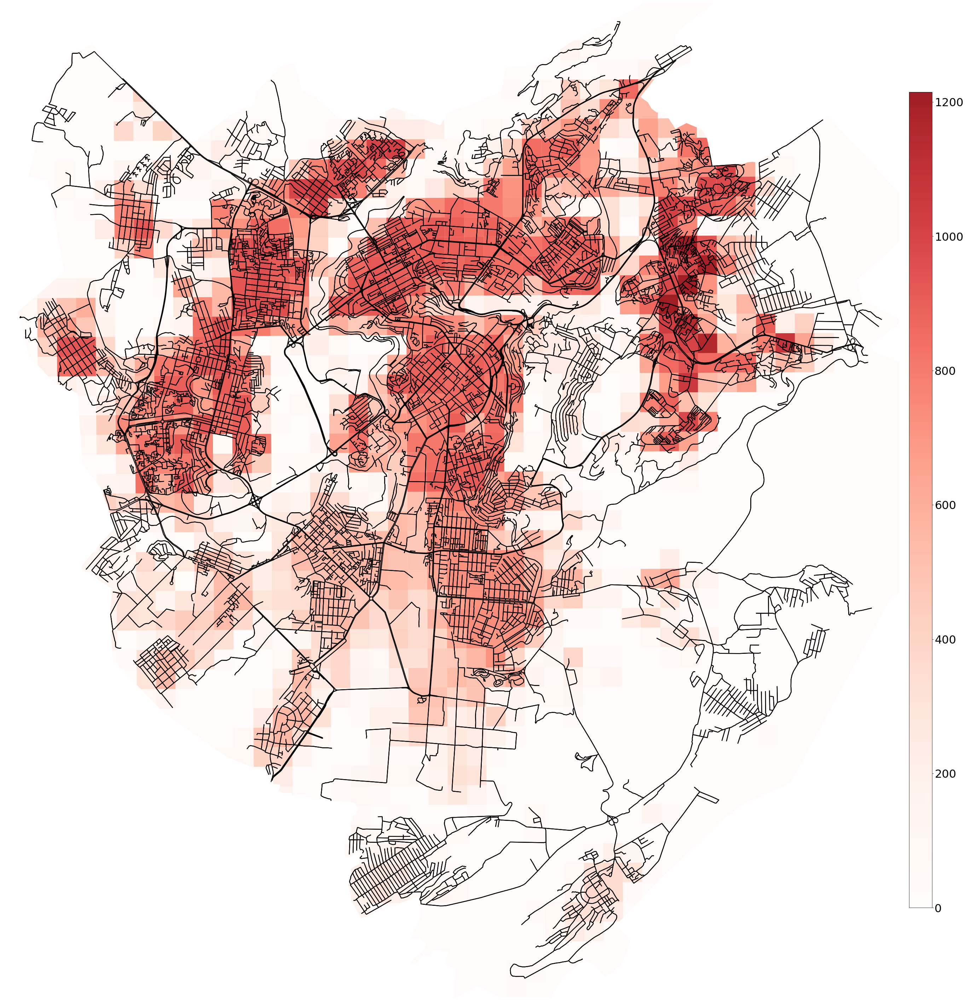

time: 5.76 s (started: 2021-08-15 11:12:38 +02:00)


In [26]:
fig, ax = plt.subplots(figsize=(40,40))

#plt.close()
polyframe_gps.plot(ax=ax, column = 'population', legend=False, cmap=new_cmap)

ox.plot_graph(G, ax=ax, figsize=(40,40),show=False, close=False, \
              node_color='grey', node_size=0, edge_linewidth=2.25, node_alpha=0.8, node_zorder=10,
              edge_color='black')

cbax = fig.add_axes([0.95, 0.1, 0.0225, 0.8])

sm = plt.cm.ScalarMappable(cmap=new_cmap, \
                          norm = plt.Normalize(vmin=min(polyframe_gps.population), vmax=max(polyframe_gps.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.axis('off')
plt.tight_layout()
#plt.savefig('../data/Milan_pop_density_with_streets.jpg', dpi=150)
plt.show()

In [27]:
# let's get a list containing the street network node IDs
graph = G.nodes(data=True)
nodelist = [x[0] for x in graph]
nodelist[:10]

[130040577,
 130040637,
 256031240,
 256031241,
 256031247,
 256031248,
 256031398,
 256031400,
 256031401,
 256031402]

time: 5.65 ms (started: 2021-08-15 11:12:44 +02:00)


In [28]:
# then, we create a dataframe containing features of the street nodes (junctions)
from tqdm import tqdm
street_dict = {'osmid':[], 'lon':[], 'lat':[], 'street_count':[]}
for node in tqdm(nodelist):
    street_dict['osmid'].append(node)
    street_dict['lon'].append(graph[node]['x'])
    street_dict['lat'].append(graph[node]['y'])
    street_dict['street_count'].append(graph[node]['street_count'])
    
street_frame = pd.DataFrame(street_dict)
street_frame.head(10)

100%|██████████| 10305/10305 [00:00<00:00, 232476.71it/s]


,osmid,lon,lat,street_count
0,130040577,44.462378,40.190717,4
1,130040637,44.459986,40.157260,3
2,256031240,44.532705,40.141424,5
3,256031241,44.515542,40.142357,4
4,256031247,44.496758,40.143420,3
5,256031248,44.495006,40.141920,3
6,256031398,44.529686,40.150765,4
7,256031400,44.522736,40.150280,4
8,256031401,44.518489,40.150504,4
9,256031402,44.516265,40.150632,4


time: 118 ms (started: 2021-08-15 11:12:44 +02:00)


In [29]:
# let's create Point geometries from the lat, lon pairs. 
geometry = [Point(xy) for xy in zip(street_frame.lon, street_frame.lat)]
street_frame = street_frame.drop(['lon', 'lat'], axis=1)
gdf = gpd.GeoDataFrame(street_frame, crs=crs, geometry=geometry)
gdf.tail()

,osmid,street_count,geometry
10300,8930247968,3,POINT (44.51043 40.19834)
10301,8930899167,1,POINT (44.47086 40.22522)
10302,8943920377,4,POINT (44.44203 40.16201)
10303,8950154126,3,POINT (44.56176 40.20857)
10304,8950342174,3,POINT (44.57200 40.18572)


time: 508 ms (started: 2021-08-15 11:12:44 +02:00)


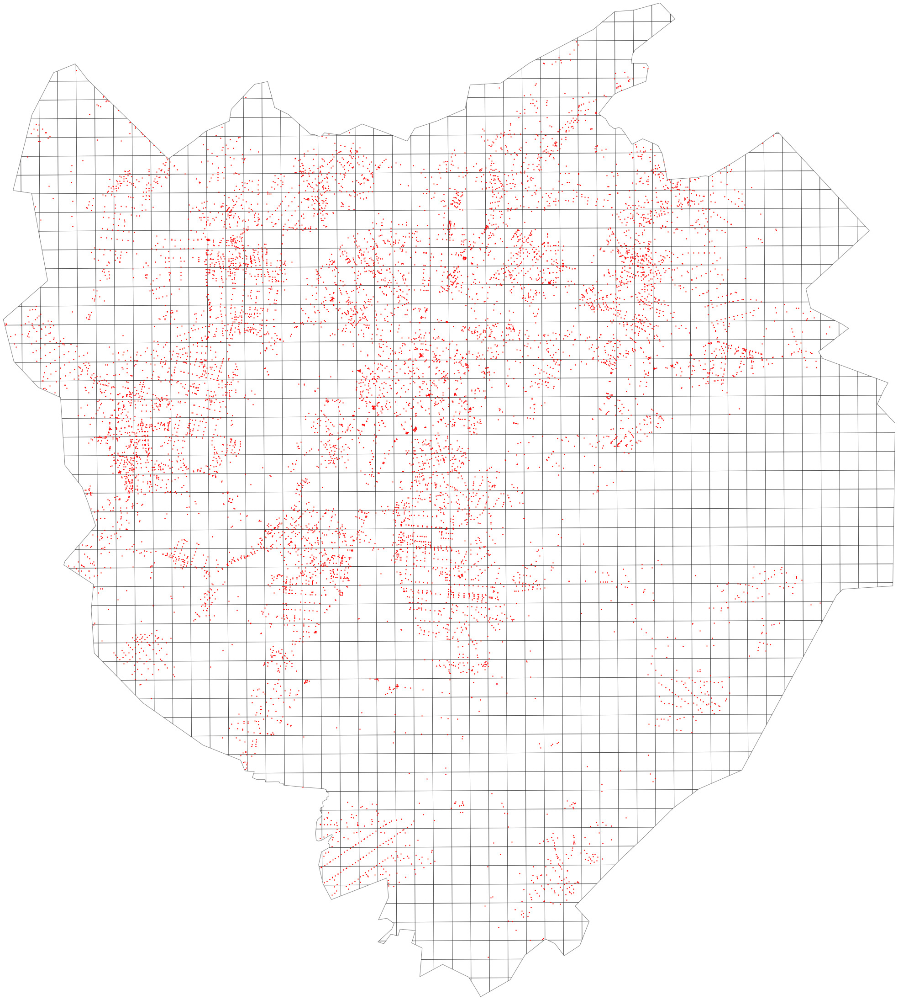

time: 3.3 s (started: 2021-08-15 11:12:44 +02:00)


In [30]:
west, south, east, north = polyframe_gps.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(polyframe_gps.geometry, np.arange(len(polyframe_gps))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
#     plt.annotate(s=n, xy=p,
#                  horizontalalignment='center', size=7)
gdf.plot(ax=ax, color='red', markersize=2, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [31]:
pointInPoly = gpd.sjoin(polyframe_gps, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.head(10)

10305


,geometry,population,index_right,osmid,street_count
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,8844,5522397005,3
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,9216,6448385180,3
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,9215,6448385172,3
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,8843,5522397001,3
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,6301,3515585658,3
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,6300,3515584752,1
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,9213,6448384478,1
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,6302,3515585722,3
7,"POLYGON ((44.42075 40.19650, 44.42078 40.19295...",304.381195,8845,5522397008,1
7,"POLYGON ((44.42075 40.19650, 44.42078 40.19295...",304.381195,1895,1332773900,3


time: 554 ms (started: 2021-08-15 11:12:48 +02:00)


In [32]:
streetcounts = pointInPoly.groupby(pointInPoly.index)['index_right'].count()
counts = pd.DataFrame(streetcounts)
counts.columns = ['counts']
counts

,counts
0,3
2,4
3,1
7,11
8,12
...,...
1719,3
1723,1
1725,1
1726,1


time: 7.26 ms (started: 2021-08-15 11:12:48 +02:00)


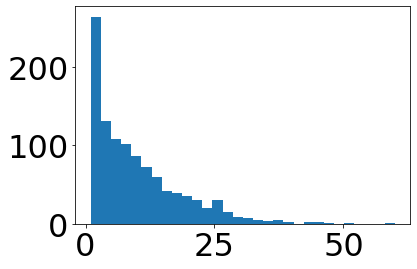

time: 101 ms (started: 2021-08-15 11:12:48 +02:00)


In [33]:
# a quick histogram of the street node counts
plt.hist(counts.counts, bins=30)
plt.show()

In [34]:
polycounts = polyframe_gps.copy()
polycounts['counts'] = counts.counts
polycounts['counts'].fillna(0, inplace=True)
polycounts['counts'] = polycounts['counts'].astype(int)
polycounts

,geometry,population,counts
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,3
1,"POLYGON ((44.41528 40.19647, 44.41614 40.19704...",0.000000,0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,4
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,1
4,"POLYGON ((44.41623 40.18583, 44.41625 40.18436...",0.000000,0
...,...,...,...
1726,"POLYGON ((44.41608 40.22487, 44.41724 40.22842...",0.000000,1
1727,"POLYGON ((44.41724 40.22842, 44.41840 40.23198...",0.000000,6
1728,"POLYGON ((44.41840 40.23198, 44.41866 40.23278...",0.000000,0
1729,"POLYGON ((44.41596 40.21819, 44.41397 40.21841...",0.000000,0


time: 98.7 ms (started: 2021-08-15 11:12:48 +02:00)


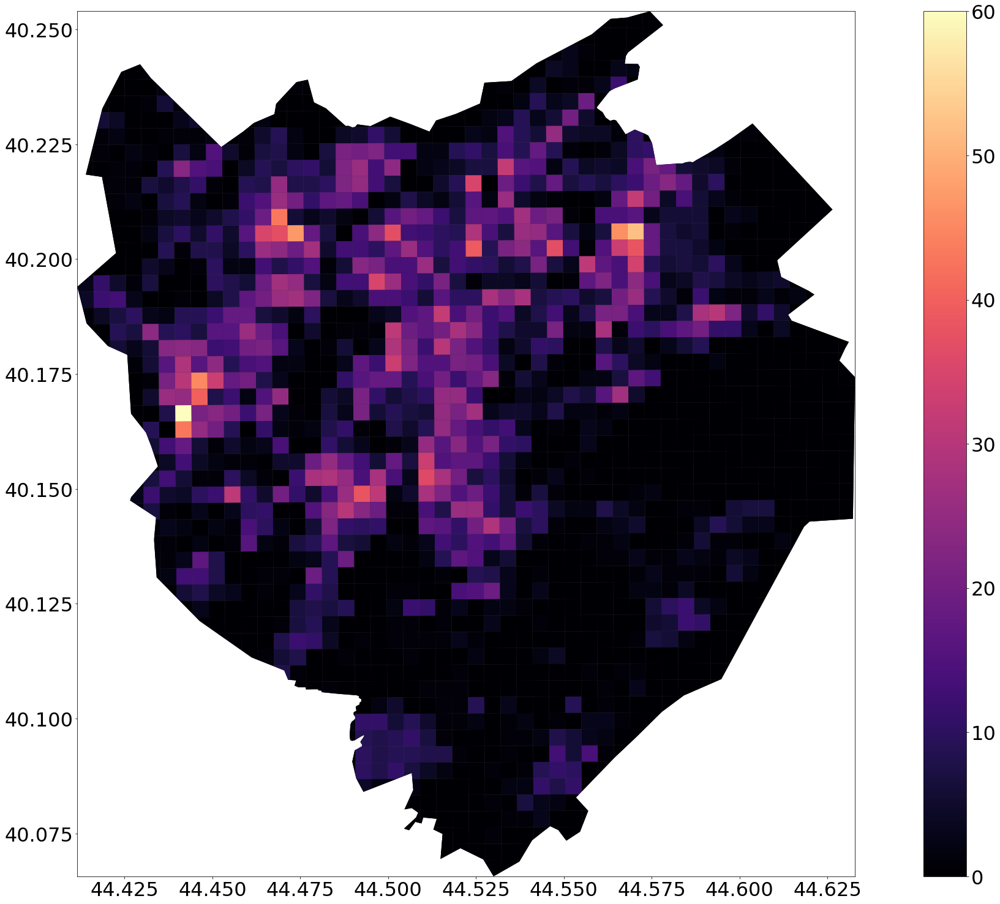

time: 1.31 s (started: 2021-08-15 11:12:48 +02:00)


In [35]:
# plot the city street network density
west, south, east, north = polycounts.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polycounts.plot(column='counts',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

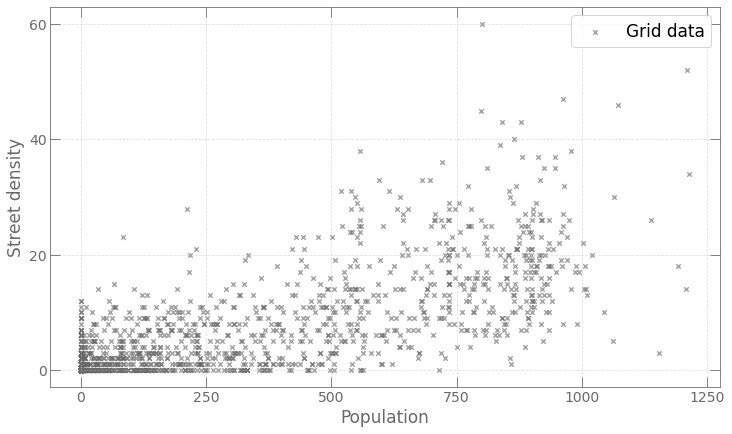

time: 141 ms (started: 2021-08-15 11:12:50 +02:00)


In [36]:
fig, ax = plt.subplots(figsize=(12, 7))
ax.scatter(polycounts.population, polycounts.counts, alpha=0.6, color='dimgrey',\
           zorder=1, marker='x', label = "Grid data", s=20)

ax.legend(prop={'size': 17})
plt.xlabel('Population', size=17, color='dimgrey')
plt.ylabel('Street density', size=17, color='dimgrey', rotation=90)

ax.yaxis.set_ticks_position('both')
ax.xaxis.set_ticks_position('both')
ax.tick_params(direction="in", size=10)
ax.spines['bottom'].set_color('dimgrey')
ax.spines['top'].set_color('dimgrey') 
ax.spines['right'].set_color('dimgrey')
ax.spines['left'].set_color('dimgrey')
ax.tick_params(axis='x', colors='dimgrey')
ax.tick_params(axis='y', colors='dimgrey')
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4,ls='--')
# plt.savefig('pop_dens_milan.jpg', dpi=120)
plt.show()

In [37]:
np.corrcoef(polycounts.population,polycounts.counts)

array([[1.        , 0.76167521],
       [0.76167521, 1.        ]])

time: 2.66 ms (started: 2021-08-15 11:12:50 +02:00)


In [38]:
import pandana

time: 7.39 ms (started: 2021-08-15 11:12:50 +02:00)


In [39]:
from pandana.loaders import osm

import warnings
warnings.filterwarnings('ignore')

time: 1.06 ms (started: 2021-08-15 11:12:50 +02:00)


In [40]:
# get bounding box of city first
west, south, east, north = polycounts.unary_union.bounds
print(west, south, east, north)

44.411554599999995 40.065685099999975 44.63287079999999 40.25394739999995
time: 228 ms (started: 2021-08-15 11:12:50 +02:00)


In [41]:
network = osm.pdna_network_from_bbox(south, west, north, east)

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](40.06568510,44.41155460,40.25394740,44.63287080);>;);out;'}"
Downloaded 12,542.7KB from www.overpass-api.de in 2.62 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 2.82 seconds
Returning OSM data with 89,526 nodes and 17,938 ways...
Edge node pairs completed. Took 16.71 seconds
Returning processed graph with 24,240 nodes and 34,382 edges...
Completed OSM data download and Pandana node and edge table creation in 21.28 seconds
time: 22.7 s (started: 2021-08-15 11:12:50 +02:00)


In [42]:
network.nodes_df.head()

,x,y
id,,
130033968,44.451873,40.224815
130033969,44.429865,40.241243
130033970,44.428164,40.243305
130040577,44.462378,40.190717
130040637,44.459986,40.157260


time: 6.87 ms (started: 2021-08-15 11:13:13 +02:00)


In [43]:
network.edges_df.head()

from          to    distance
130033968 1141147330  130033968  1141147330   17.155968
          8380226041  130033968  8380226041  212.413944
130033969 2762265297  130033969  2762265297   78.978293
130033970 1362845951  130033970  1362845951  449.175571
130040577 1317612052  130040577  1317612052   13.670998

time: 9.72 ms (started: 2021-08-15 11:13:13 +02:00)


In [44]:
restaurants = osm.node_query(
    south, west, north, east, tags='"amenity"="restaurant"')

time: 2.81 s (started: 2021-08-15 11:13:13 +02:00)


In [45]:
restaurants.head()

,lat,lon,addr:city,addr:housenumber,addr:street,amenity,cuisine,internet_access,name,name:en,...,start_date,diet:vegan,disused,contact:email,contact:website,air_conditioning,bar,name:fr,name:prg,ele
id,,,,,,,,,,,,,,,,,,,,,
370052673,40.178316,44.524867,Երևան,7,Ալեք Մանուկյանի փողոց,restaurant,georgian;armenian,wlan,Միմինո,"""Mimino""",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
370052729,40.178394,44.520443,Երևան,72/1,Հանրապետության փողոց,restaurant,NaN,wlan,«ԲԱՖՖԸԼՈ» ԳՐԻԼ-ԲԱՐ,"""Buffalo"" Grill-Bar",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
370055074,40.188291,44.519089,NaN,NaN,NaN,restaurant,NaN,NaN,Առագաստ,Aragast,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
370064207,40.170538,44.513235,Երևան,31/2,Խորենացու փողոց,restaurant,pizza,NaN,Pizza di Roma,"""Pizza di Roma""",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
370148312,40.183031,44.517692,NaN,NaN,NaN,restaurant,italian,NaN,Գուստո,"""Gusto""",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


time: 23.4 ms (started: 2021-08-15 11:13:16 +02:00)


In [46]:
restaurant_nodes = network.get_node_ids(restaurants.lon, restaurants.lat)
network.set(restaurant_nodes, 
            name = 'restaurants')

time: 7.94 ms (started: 2021-08-15 11:13:16 +02:00)


In [47]:
accessibility = network.aggregate(distance = 500,
                                  type = 'count',
                                  name = 'restaurants')
accessibility.describe()

count    24240.000000
mean         3.701609
std         10.075594
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max         69.000000
dtype: float64

time: 71.7 ms (started: 2021-08-15 11:13:16 +02:00)


In [48]:
accessibility.head()

id
130033968    1.0
130033969    0.0
130033970    0.0
130040577    2.0
130040637    1.0
dtype: float64

time: 3.37 ms (started: 2021-08-15 11:13:16 +02:00)


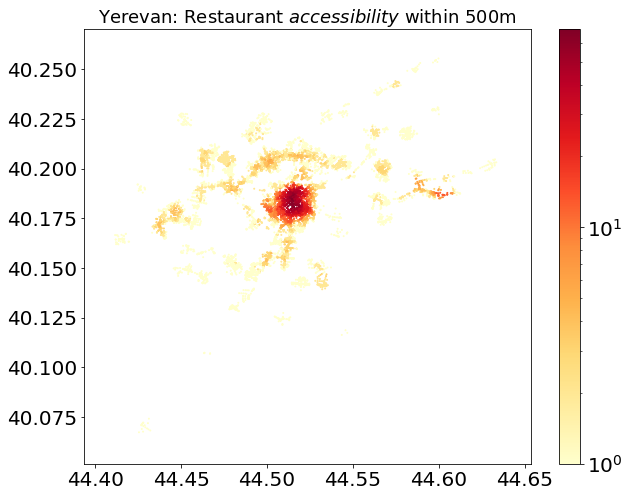

time: 642 ms (started: 2021-08-15 11:13:16 +02:00)


In [49]:

import matplotlib
plt.rcParams.update({'font.size':20})
fig, ax = plt.subplots(figsize=(10,8))

plt.title('Yerevan: Restaurant $accessibility$ within 500m', size = 18)
plt.scatter(network.nodes_df.x, network.nodes_df.y, 
            c=accessibility, s=1, cmap='YlOrRd', 
            norm=matplotlib.colors.LogNorm())
cb = plt.colorbar()

plt.show()

In [50]:
network_nodes = network.nodes_df
network_nodes.head()

,x,y
id,,
130033968,44.451873,40.224815
130033969,44.429865,40.241243
130033970,44.428164,40.243305
130040577,44.462378,40.190717
130040637,44.459986,40.157260


time: 5.23 ms (started: 2021-08-15 11:13:16 +02:00)


In [51]:
network_nodes['accessibility'] = accessibility
network_nodes.head()

,x,y,accessibility
id,,,
130033968,44.451873,40.224815,1.0
130033969,44.429865,40.241243,0.0
130033970,44.428164,40.243305,0.0
130040577,44.462378,40.190717,2.0
130040637,44.459986,40.157260,1.0


time: 7.32 ms (started: 2021-08-15 11:13:16 +02:00)


In [52]:
geometry = [Point(xy) for xy in zip(network_nodes.x, network_nodes.y)]
network_nodes = network_nodes.drop(['x', 'y'], axis=1)
network_gdf = gpd.GeoDataFrame(network_nodes, crs=crs, geometry=geometry)
network_gdf.head()

,accessibility,geometry
id,,
130033968,1.0,POINT (44.45187 40.22481)
130033969,0.0,POINT (44.42987 40.24124)
130033970,0.0,POINT (44.42816 40.24331)
130040577,2.0,POINT (44.46238 40.19072)
130040637,1.0,POINT (44.45999 40.15726)


time: 680 ms (started: 2021-08-15 11:13:16 +02:00)


In [53]:
len(network_gdf)

24240

time: 1.56 ms (started: 2021-08-15 11:13:17 +02:00)


In [54]:
pointInPoly = gpd.sjoin(polyframe_gps, network_gdf, op='contains')

time: 868 ms (started: 2021-08-15 11:13:17 +02:00)


In [55]:

print(len(pointInPoly))
pointInPoly.head(10)

21316


,geometry,population,index_right,accessibility
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,5522397005,0.0
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,6448385180,0.0
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,6448385172,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,3515585658,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,6448385100,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,6448385103,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,6448385105,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,5522397001,0.0
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,3515585722,0.0
7,"POLYGON ((44.42075 40.19650, 44.42078 40.19295...",304.381195,1332773900,0.0


time: 21.3 ms (started: 2021-08-15 11:13:18 +02:00)


In [67]:
aggr_access = pointInPoly.groupby(pointInPoly.index)['accessibility'].mean()
aggr_access_df = pd.DataFrame(aggr_access)
aggr_access_df.columns = ['aggr_access']
aggr_access_df

,aggr_access
0,0.0
2,0.0
3,0.0
7,0.0
8,0.0
...,...
1718,0.0
1719,0.0
1723,0.0
1726,0.0


time: 9.95 ms (started: 2021-08-15 11:15:09 +02:00)


In [68]:
aggr_access_df.value_counts()

aggr_access
0.000000       821
1.000000        31
0.125000         8
0.333333         8
0.375000         5
              ... 
0.974684         1
1.019231         1
1.071429         1
1.076923         1
56.048951        1
Length: 305, dtype: int64

time: 7.03 ms (started: 2021-08-15 11:15:11 +02:00)


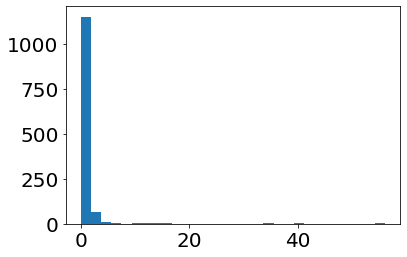

time: 122 ms (started: 2021-08-15 11:15:13 +02:00)


In [69]:
# a quick histogram of the aggregated accessibility
plt.hist(aggr_access_df.aggr_access, bins=30)
plt.show()

In [70]:
polyaccess = polyframe_gps.copy()
polyaccess['aggr_access'] = aggr_access_df.aggr_access
polyaccess['aggr_access'].fillna(0, inplace=True)
#polyaccess['aggr_access'] = polyaccess['aggr_access'].astype(int)
polyaccess

,geometry,population,aggr_access
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,0.0
1,"POLYGON ((44.41528 40.19647, 44.41614 40.19704...",0.000000,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,0.0
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,0.0
4,"POLYGON ((44.41623 40.18583, 44.41625 40.18436...",0.000000,0.0
...,...,...,...
1726,"POLYGON ((44.41608 40.22487, 44.41724 40.22842...",0.000000,0.0
1727,"POLYGON ((44.41724 40.22842, 44.41840 40.23198...",0.000000,0.0
1728,"POLYGON ((44.41840 40.23198, 44.41866 40.23278...",0.000000,0.0
1729,"POLYGON ((44.41596 40.21819, 44.41397 40.21841...",0.000000,0.0


time: 121 ms (started: 2021-08-15 11:15:17 +02:00)


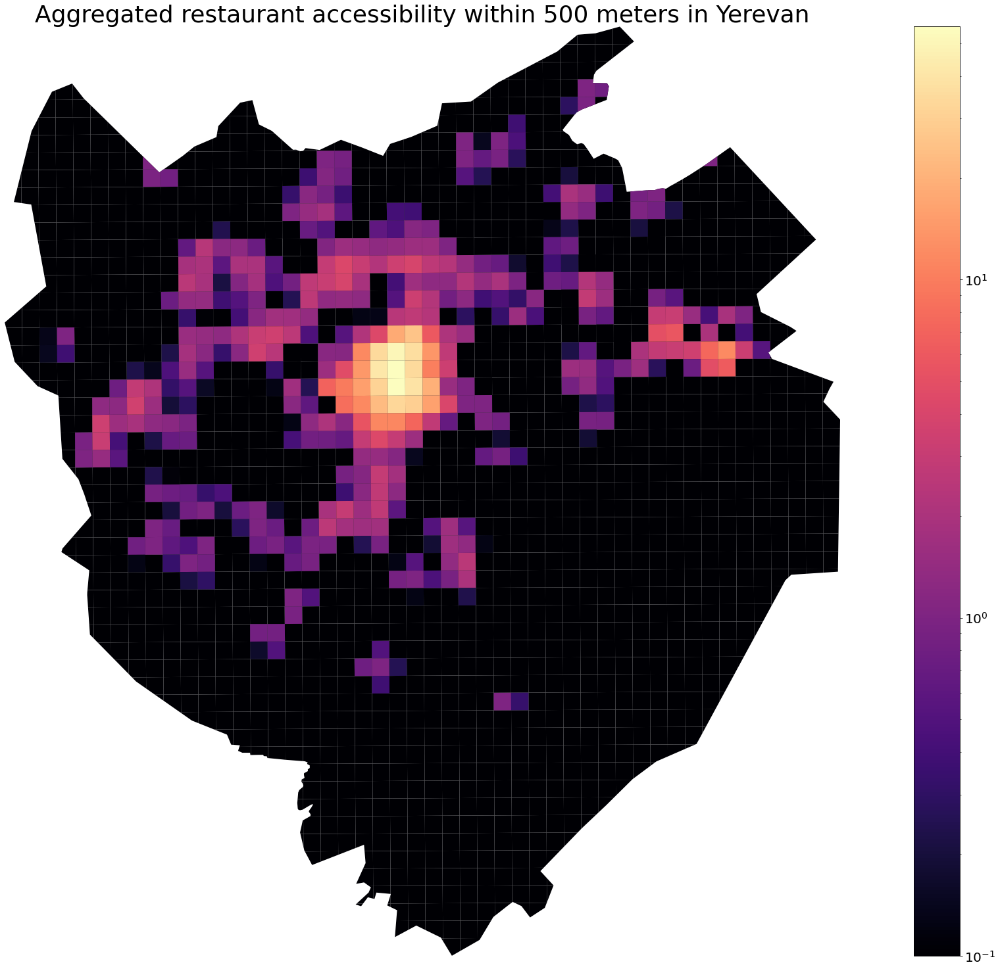

time: 1.35 s (started: 2021-08-15 11:15:18 +02:00)


In [71]:
# plot the city aggregated accessibility

LOGMIN = 0.1  # arbitrary lower bound, as appropriate for log-scaled data display
west, south, east, north = polyaccess.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe_gps.plot(ax=ax, color='#000004')
polyaccess.plot(column='aggr_access',  legend=True, \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
plt.title("Aggregated restaurant accessibility within 500 meters in Yerevan", size = 36)
ax.axis('off')
plt.show()

In [72]:
polyaccess["pop_int"] = polyaccess.population.astype(int) + 1
polyaccess.head()

,geometry,population,aggr_access,pop_int
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,0.0,105
1,"POLYGON ((44.41528 40.19647, 44.41614 40.19704...",0.000000,0.0,1
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,0.0,1
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,0.0,1
4,"POLYGON ((44.41623 40.18583, 44.41625 40.18436...",0.000000,0.0,1


time: 27 ms (started: 2021-08-15 11:15:23 +02:00)


In [73]:
polyaccess["access_normalised"] = polyaccess.aggr_access / polyaccess.pop_int 
polyaccess.head(200)

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,0.000000,105,0.000000
1,"POLYGON ((44.41528 40.19647, 44.41614 40.19704...",0.000000,0.000000,1,0.000000
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,0.000000,1,0.000000
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,0.000000,1,0.000000
4,"POLYGON ((44.41623 40.18583, 44.41625 40.18436...",0.000000,0.000000,1,0.000000
...,...,...,...,...,...
195,"POLYGON ((44.45315 40.17891, 44.45318 40.17536...",899.164958,1.555556,900,0.001728
196,"POLYGON ((44.45318 40.17536, 44.45321 40.17181...",696.622681,1.278689,697,0.001835
197,"POLYGON ((44.45321 40.17181, 44.45324 40.16827...",918.021362,0.222222,919,0.000242
198,"POLYGON ((44.45324 40.16827, 44.45327 40.16472...",807.888468,0.000000,808,0.000000


time: 120 ms (started: 2021-08-15 11:15:24 +02:00)


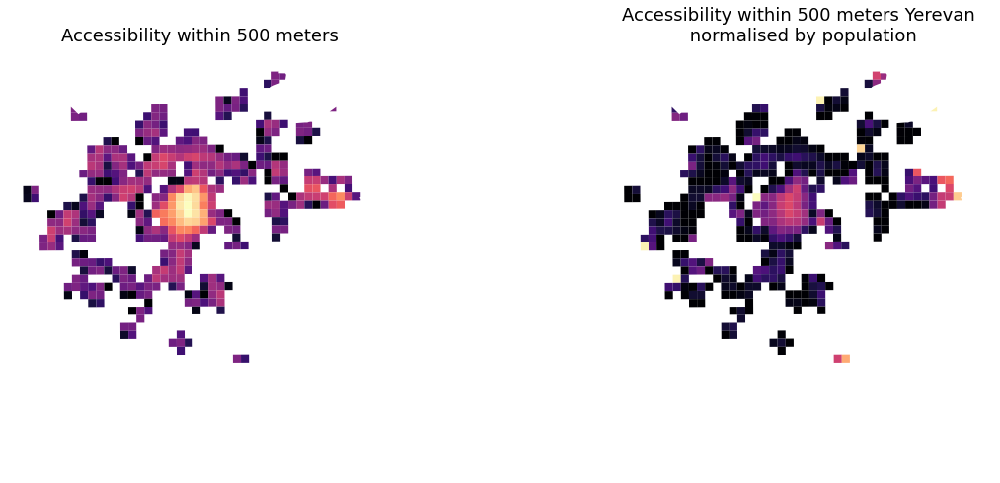

time: 949 ms (started: 2021-08-15 11:15:31 +02:00)


In [75]:
f, ax = plt.subplots(1,2,figsize=(20,8))

polyaccess.plot(column='aggr_access', ax = ax[0], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.aggr_access.min(), LOGMIN), \
                                   vmax=polyaccess.aggr_access.max()), \
                                    cmap='magma')   
  
ax[0].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[0].set_title("Accessibility within 500 meters", size = 18)


polyaccess.plot(column='access_normalised', ax = ax[1], \
    norm=matplotlib.colors.LogNorm(vmin=max(polyaccess.access_normalised.min(), 0.001), \
                                   vmax=polyaccess.access_normalised.max()), \
                                    cmap='magma')

ax[1].axis(polyaccess.total_bounds[np.asarray([0,2,1,3])])
ax[1].set_title("Accessibility within 500 meters Yerevan \n normalised by population", size = 18)
ax[0].axis('off')
ax[1].axis('off')
plt.show()

In [76]:
sum(polyaccess.access_normalised)

9.25606116219214

time: 2.49 ms (started: 2021-08-15 11:15:35 +02:00)


In [81]:
sum(polyaccess.aggr_access)

1170.304523967666

time: 2.55 ms (started: 2021-08-15 11:30:24 +02:00)


In [77]:
polyaccess.access_normalised.mean()

0.005347233484801929

time: 2.29 ms (started: 2021-08-15 11:15:36 +02:00)


In [78]:
polyaccess.aggr_access.mean()

0.6760858024076638

time: 2.18 ms (started: 2021-08-15 11:15:37 +02:00)


In [83]:
polyaccess.describe()

,population,aggr_access,pop_int,access_normalised
count,1731.000000,1731.000000,1731.000000,1731.000000
mean,266.678839,0.676086,267.336800,0.005347
std,320.894309,3.625729,320.748064,0.060092
min,0.000000,0.000000,1.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000
50%,106.752869,0.000000,107.000000,0.000000
75%,504.045898,0.026857,504.500000,0.000031
max,1214.468018,56.048951,1215.000000,1.181818


time: 26.6 ms (started: 2021-08-15 11:33:13 +02:00)


In [84]:
polyaccess.head()

,geometry,population,aggr_access,pop_int,access_normalised
0,"POLYGON ((44.41155 40.19399, 44.41528 40.19647...",104.181908,0.0,105,0.0
1,"POLYGON ((44.41528 40.19647, 44.41614 40.19704...",0.000000,0.0,1,0.0
2,"POLYGON ((44.41617 40.19293, 44.41620 40.18938...",0.000000,0.0,1,0.0
3,"POLYGON ((44.41620 40.18938, 44.41623 40.18583...",0.000000,0.0,1,0.0
4,"POLYGON ((44.41623 40.18583, 44.41625 40.18436...",0.000000,0.0,1,0.0


time: 28.2 ms (started: 2021-08-15 11:33:55 +02:00)


In [86]:
sum(polyaccess.pop_int)

462760

time: 2.59 ms (started: 2021-08-15 12:09:20 +02:00)


In [88]:
sum(polyaccess.access_normalised)

9.25606116219214

time: 11.5 ms (started: 2021-08-18 13:31:08 +02:00)


In [89]:
#print final score
polyaccess.access_normalised.mean()

0.005347233484801929

time: 9.18 ms (started: 2021-08-18 13:31:23 +02:00)
